# Traffic accidents in BCN

Listado de los accidentes gestionados por la Guardia Urbana en la ciudad de Barcelona. Incorpora el número de lesionados segun gravedad, el número de vehiculos y el punto de impacto. Las coordenadas se expresan en el sistema de referencia ED50 y en el sistema geográfico (longitud y latitud).

In [1]:
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
import folium
import pandas as pd
import geopandas
from geopandas import gpd
import seaborn as sns
import re

## Accidentes en bcn durante en 2018

In [294]:
acc_2018 = pd.read_csv('https://opendata-ajuntament.barcelona.cat/data/dataset/e769eb9d-d778-4cd7-9e3a-5858bba49b20/resource/f94d9ac3-e46e-47cd-a3d0-a9b5b9639d86/download/2018_accidents_gu_bcn.csv')
acc_2018

,Numero_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Codi_carrer,Nom_carrer,Num_postal,Descripcio_dia_setmana,Dia_setmana,...,Descripcio_causa_vianant,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
0,2018S000150,3,Sants-Montjuïc,12,la Marina del Prat Vermell,701819,Número 3 Zona Franca / E Zona Franca ...,69-75,Dilluns,Dl,...,No és causa del vianant,0,1,0,1,2,427265.97,4576644.81,2.129612,41.336163
1,2018S000761,3,Sants-Montjuïc,11,el Poble-sec,234001,Olímpic ...,5-7,Diumenge,Dg,...,No és causa del vianant,0,0,0,0,2,429210.58,4579530.49,2.152513,41.362326
2,2018S005151,3,Sants-Montjuïc,12,la Marina del Prat Vermell,370531,A Zona Franca / Número 6 Zona Franca ...,NaN,Dimecres,Dc,...,No és causa del vianant,0,1,0,1,2,427519.99,4575229.36,2.132817,41.323437
3,2018S000933,3,Sants-Montjuïc,12,la Marina del Prat Vermell,701819,Número 3 Zona Franca / E ...,69-75,Diumenge,Dg,...,No és causa del vianant,0,2,0,2,1,427360.59,4576569.22,2.130752,41.335490
4,2018S006926,3,Sants-Montjuïc,12,la Marina del Prat Vermell,370203,Número 3 Zona Franca ...,77-111,Divendres,Dv,...,No és causa del vianant,0,0,0,0,2,426842.33,4576816.19,2.124529,41.337668
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9931,2018S003036,8,Nou Barris,55,Ciutat Meridiana,3701,Agudes ...,60,Divendres,Dv,...,No és causa del vianant,0,1,0,1,2,431412.82,4590753.47,2.177567,41.463599
9932,2018S003108,8,Nou Barris,55,Ciutat Meridiana,92950,Costabona / Agudes ...,NaN,Diumenge,Dg,...,No és causa del vianant,0,0,0,0,2,431504.89,4590741.53,2.178671,41.463499
9933,2018S009777,8,Nou Barris,55,Ciutat Meridiana,3701,Agudes ...,29-31,Dissabte,Ds,...,No és causa del vianant,0,0,0,0,3,431424.70,4590723.00,2.177713,41.463326
9934,2018S000005,8,Nou Barris,56,Vallbona,330606,C-17 (Barcelona) ...,K14,Dilluns,Dl,...,No és causa del vianant,0,1,0,1,1,431568.59,4590758.85,2.179432,41.463661


In [307]:
acc_2018.Nom_carrer.value_counts

<bound method IndexOpsMixin.value_counts of 0       Número 3 Zona Franca / E Zona Franca          ...
1       Olímpic                                       ...
2       A Zona Franca / Número 6 Zona Franca          ...
3       Número 3 Zona Franca / E                      ...
4       Número 3 Zona Franca                          ...
                              ...                        
9931    Agudes                                        ...
9932    Costabona / Agudes                            ...
9933    Agudes                                        ...
9934    C-17 (Barcelona)                              ...
9935    C-17 (Barcelona)                              ...
Name: Nom_carrer, Length: 9936, dtype: object>

In [306]:
import re
acc_2018.loc[acc_2018['Nom_carrer'].str.contains('iagonal')]

ValueError: cannot mask with array containing NA / NaN values

## ACCIDENT BY MONTH

In [167]:
acc_by_time_day = acc_2018.groupby(['Descripcio_tipus_dia','Descripcio_torn'], as_index=False).sum()

In [168]:
acc_by_time_day

,Descripcio_tipus_dia,Descripcio_torn,Codi_districte,Codi_barri,Codi_carrer,Any,Mes_any,Dia_mes,Hora_dia,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
0,Laboral,Matí,19235,107576,983561954,7922668,25262,61470,39558,3,4466,70,4539,7516,1.688612e+09,1.799560e+10,21477.109042,410596.854720
1,Laboral,Nit,5632,31576,298790046,2363078,7787,18022,14216,9,1368,32,1409,2253,5.038469e+08,5.367527e+09,2534.872418,89813.120335
2,Laboral,Tarda,23176,129152,1207704082,9765102,31356,76089,83606,9,5807,134,5950,9324,2.081233e+09,2.218047e+10,12584.786663,365735.369331


## ACCIDENT BY DAY OF THE YEAR

In [11]:
acc_2018[['Descripcio_tipus_dia', 'Any', 'Mes_any', 'Nom_mes', 'Dia_mes', 'Hora_dia', 'Descripcio_torn']]

,Descripcio_tipus_dia,Any,Mes_any,Nom_mes,Dia_mes,Hora_dia,Descripcio_torn
0,Laboral,2018,1,Gener,8,7,Matí
1,Laboral,2018,1,Gener,28,19,Tarda
2,Laboral,2018,7,Juliol,4,13,Matí
3,Laboral,2018,2,Febrer,4,7,Matí
4,Laboral,2018,9,Setembre,14,6,Matí
...,...,...,...,...,...,...,...
9931,Laboral,2018,4,Abril,20,13,Matí
9932,Laboral,2018,4,Abril,22,2,Nit
9933,Laboral,2018,12,Desembre,22,2,Nit
9934,Laboral,2018,1,Gener,1,9,Matí


In [188]:
acc_by_day = acc_2018.groupby(['Mes_any', 'Dia_mes','Descripcio_dia_setmana'], as_index=False).sum()
acc_by_day['year_day']=range(1,366)

In [189]:
acc_by_day

,Mes_any,Dia_mes,Descripcio_dia_setmana,Codi_districte,Codi_barri,Codi_carrer,Any,Hora_dia,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud,year_day
0,1,1,Dilluns,84,501,4803092,32288,237,0,16,0,16,29,6893152.10,7.333923e+07,34.740860,662.400544,1
1,1,2,Dimarts,127,685,6189515,54486,369,0,28,1,29,52,11603714.54,1.237741e+08,58.282913,1117.925466,2
2,1,3,Dimecres,106,592,5437785,46414,354,0,25,1,26,43,9879671.86,1.054277e+08,49.590015,952.220931,3
3,1,4,Dijous,116,617,5830019,50450,336,0,29,0,29,46,10740653.34,1.145736e+08,53.927204,1034.827812,4
4,1,5,Divendres,102,553,4496041,44396,316,0,24,1,25,41,9457937.87,1.008412e+08,47.527730,910.796606,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,12,27,Dijous,123,672,7742598,54486,356,0,31,0,31,56,11621415.60,1.237530e+08,58.497111,1117.737013,361
361,12,28,Divendres,160,968,7664729,52468,363,0,29,0,29,53,11207467.82,1.191832e+08,2242.338103,1076.464230,362
362,12,29,Dissabte,71,362,3511435,38342,220,0,29,0,29,35,8173129.40,8.707320e+07,41.107317,786.445302,363
363,12,30,Diumenge,87,511,4450604,28252,168,0,16,0,16,25,6035805.13,6.418335e+07,30.448335,579.704679,364


In [191]:
acc_top10=acc_by_day.sort_values(by='Numero_victimes',ascending=False)
acc_top10.tail(15)

,Mes_any,Dia_mes,Descripcio_dia_setmana,Codi_districte,Codi_barri,Codi_carrer,Any,Hora_dia,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud,year_day
250,9,8,Dissabte,44,241,1644840,18162,129,0,13,1,14,17,3875104.43,41259022.37,19.513645,372.651515,251
91,4,2,Dilluns,28,163,1525748,10090,73,0,14,0,14,13,2147561.04,22921438.00,10.777861,207.025979,92
358,12,25,Dimarts,44,256,2819161,20180,179,0,13,1,14,18,4297828.90,45837096.65,21.588731,414.000147,359
89,3,31,Dissabte,42,243,3145513,18162,132,0,13,0,13,16,3880758.00,41255331.13,19.581672,372.618750,90
153,6,3,Diumenge,64,394,3767737,22198,149,0,13,0,13,21,4741568.28,50424531.96,23.914168,455.434911,154
166,6,16,Dissabte,38,205,2391306,20180,118,1,11,1,13,25,4305719.86,45828448.85,21.684105,413.922943,167
244,9,2,Diumenge,46,270,3027115,18162,140,0,12,0,12,17,3880533.98,41253283.69,19.579269,372.600296,245
243,9,1,Dissabte,47,255,3301665,22198,125,0,12,0,12,20,4721962.51,50417194.08,23.680460,455.367131,244
202,7,22,Diumenge,71,422,3916003,28252,185,0,12,0,12,30,6024637.28,64175013.79,30.315695,579.628607,203
90,4,1,Diumenge,81,460,3384225,28252,220,0,12,0,12,25,6016881.00,64196273.12,30.220479,579.819387,91


In [ ]:
acc_top10.tail(15)

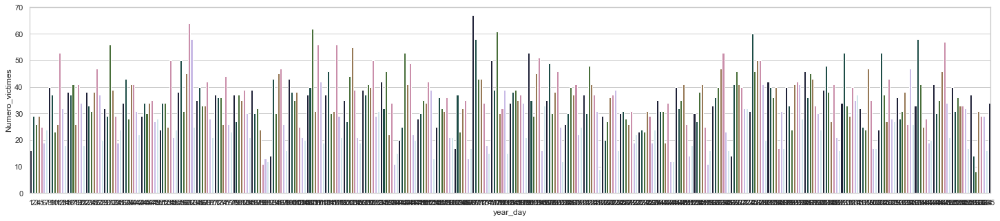

In [197]:
palette = sns.color_palette("cubehelix", 7)

ax = plt.figure(figsize=(25,5))
sns.barplot(x="year_day", y="Numero_victimes",
                  palette=palette, data=acc_by_day)
ax.savefig('Acc_by_day_bar_cube.png', dpi=400)

## Accidents by week day mean

In [192]:
acc_by_weekday = acc_2018.groupby(['Descripcio_dia_setmana'], as_index=False).mean()

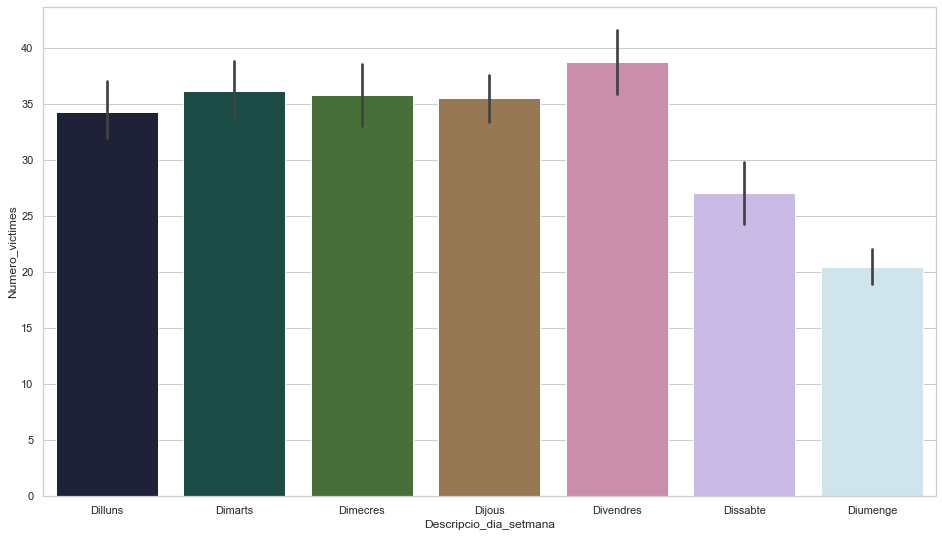

In [198]:
palette = sns.color_palette("cubehelix", 7)

ax = plt.figure(figsize=(16,9))
sns.barplot(x="Descripcio_dia_setmana", y="Numero_victimes",
                  palette=palette, data=acc_by_day)
ax.savefig('Acc_by_weekday_bar_cube.png', dpi=400)

## ACCIDENTS BY HOUR OF THE DAY

In [24]:
acc_by_hour = acc_2018.groupby('Hora_dia', as_index=False).sum()
acc_by_hour.head()

,Hora_dia,Codi_districte,Codi_barri,Codi_carrer,Any,Mes_any,Dia_mes,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
0,0,759,4169,47148455,334988,1162,2570,1,217,4,222,332,71376911.62,7.608767e+08,358.769361,6872.233090
1,1,621,3580,27134242,244178,900,2020,1,130,2,133,233,52085755.31,5.546467e+08,262.202663,5009.569738
2,2,381,2109,22438664,171530,532,1293,3,95,2,100,154,36578643.02,3.896057e+08,184.068654,3518.918535
3,3,363,2037,17549790,147314,471,1160,2,72,2,76,137,31413983.96,3.345772e+08,158.078105,3021.901448
4,4,290,1581,17247507,133188,487,1017,0,60,0,60,128,28400791.15,3.025240e+08,142.905747,2732.396434


In [19]:
acc_by_hour['Hora_dia']=acc_by_hour.Hora_dia.astype('str')

In [20]:
acc_by_hour['Hora_dia']=acc_by_hour['Hora_dia'].apply(lambda x: x.zfill(2))

In [134]:
acc_by_hour.columns

Index(['Hora_dia', 'Codi_districte', 'Codi_barri', 'Codi_carrer', 'Any',
       'Mes_any', 'Dia_mes', 'Numero_morts', 'Numero_lesionats_lleus',
       'Numero_lesionats_greus', 'Numero_victimes',
       'Numero_vehicles_implicats', 'Coordenada_UTM_X', 'Coordenada_UTM_Y',
       'Longitud', 'Latitud'],
      dtype='object')

In [22]:
dft = acc_by_hour.copy()
dft['Hora_dia'] = dft.Hora_dia.apply(lambda x: x+':00')

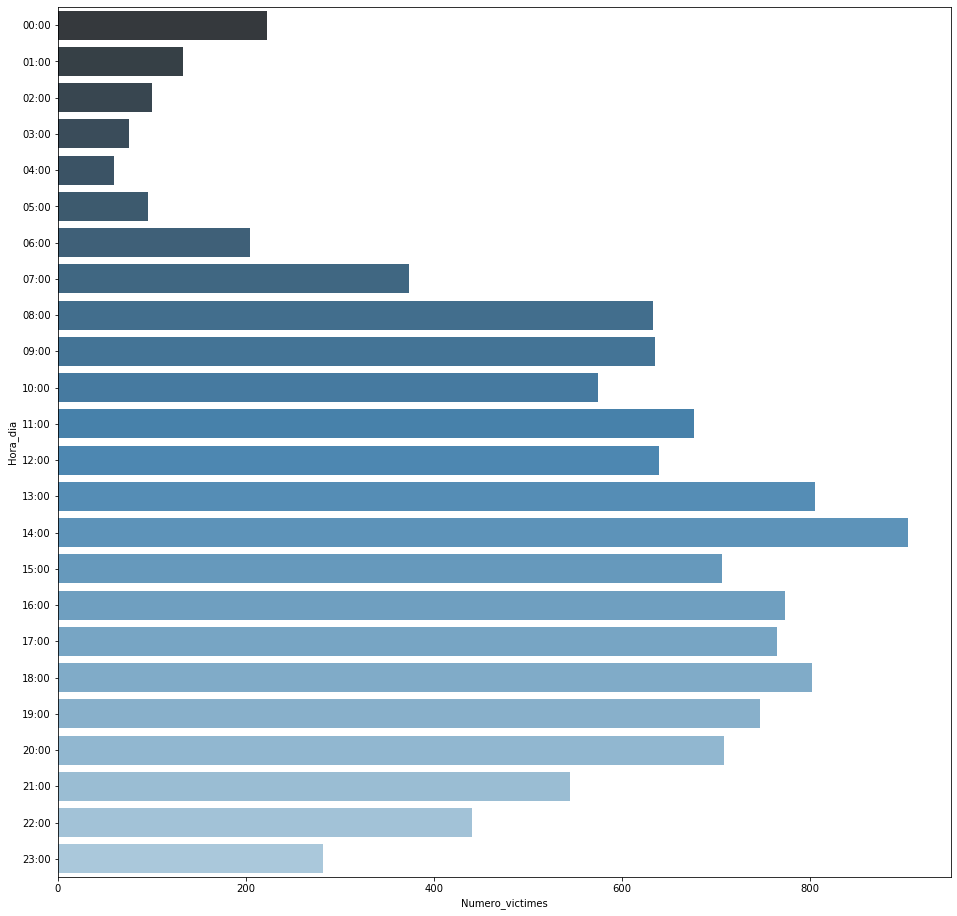

In [23]:
plt.figure(figsize=(16,16))
ax=sns.barplot(x="Numero_victimes", y="Hora_dia", data=dft, palette="Blues_d")
ax.set_xlabel('Numero_victimes')
plt.savefig('Acc_by_hour2.png', dpi=300)


## MAP OF ACCIDENT'S LOCATION BY HOUR 

In [25]:
def df_by_hour(h):
    result = acc_2018.loc[acc_2018['Hora_dia']==h]
    return result

In [480]:
def dot_map(hora,data_acc):
    d = folium.Map(location=[41.3902, 2.1540],
                   width='50%', 
                   height='100%',
                   zoom_start=13,
                   tiles='cartodbpositron')

    for index, row in data_acc.iterrows():
        radi = (row['Numero_morts']*6 + row['Numero_victimes']*3)
        acc_gra =(row['Numero_morts'],row['Numero_victimes'])
        popup_text = "<br>adress: {}<br> total death: {}<br> total injured: {}"
        popup_text = popup_text.format(row["Nom_carrer"], row["Numero_morts"], row["Numero_victimes"], acc_gra)
        if row['Numero_morts'] > 0:
            color="#E37222"
        else:
            color="#0A8A9F"
        folium.CircleMarker(location=[row['Latitud'],row['Longitud']],
                             radius=radi,
                             color=color,
                             popup = popup_text,
                             fill=True).add_to(d)
        d.save(f"acc_h_{hora}.html")
    return d

In [1]:
def dot_map_n(hora,data_acc):
    d = folium.Map(location=[41.3902, 2.1540],
                   width='50%', 
                   height='100%',
                   zoom_start=13,
                   tiles='cartodbdark_matter')

    for index, row in data_acc.iterrows():
        radi = (row['Numero_morts']*6 + row['Numero_victimes']*3)
        acc_gra =(row['Numero_morts'],row['Numero_victimes'])
        popup_text = "<br>adress: {}<br> total death: {}<br> total injured: {}"
        popup_text = popup_text.format(row["Nom_carrer"], row["Numero_morts"], row["Numero_victimes"], acc_gra)
        if row['Numero_morts'] > 0:
            color="#E37222"
        else:
            color="#0A8A9F"
        folium.CircleMarker(location=[row['Latitud'],row['Longitud']],
                             radius=radi,
                             color=color,
                             popup = popup_text,
                             fill=True).add_to(d)
        d.save(f"acc_h_{hora}.html")
    return d

In [81]:
#selenium para guardar un png de la imagen
"""
import selenium.webdriver
driver = selenium.webdriver.PhantomJS()
driver.set_window_size(4000, 3000)  # choose a resolution
driver.get('map.html')
# You may need to add time.sleep(seconds) here
driver.save_screenshot('screenshot.png')

https://nbviewer.jupyter.org/github/vincentropy/python_cartography_tutorial/blob/master/part3_animations.ipynb

"""

"\nimport selenium.webdriver\ndriver = selenium.webdriver.PhantomJS()\ndriver.set_window_size(4000, 3000)  # choose a resolution\ndriver.get('map.html')\n# You may need to add time.sleep(seconds) here\ndriver.save_screenshot('screenshot.png')\n\nhttps://nbviewer.jupyter.org/github/vincentropy/python_cartography_tutorial/blob/master/part3_animations.ipynb\n\n"

## Accidents 1am

In [82]:
acc_at_1 = df_by_hour(1)
hour = '1'

In [83]:
dot_map_n(hour,acc_at_1)

## Accidents 2am

In [84]:
acc_at_2 = df_by_hour(2)
hour = '2'

In [85]:
dot_map_n(hour, acc_at_2)

## Accidents 3am

In [86]:
acc_at_3 = df_by_hour(3)
hour = '3'

In [87]:
dot_map_n(hour, acc_at_3)

## Accidents 4am

In [88]:
acc_at_4 = df_by_hour(4)
hour = '4'

In [89]:
dot_map_n(hour, acc_at_4)

## Accidents 5am

In [90]:
acc_at_5 = df_by_hour(5)
hour = '5'

In [91]:
dot_map_N(hour, acc_at_5)

## Accidents 6am

In [92]:
acc_at_6 = df_by_hour(6)
hour = '6'

In [93]:
dot_map(hour, acc_at_6)

## Accidents 7am

In [94]:
acc_at_7 = df_by_hour(7)
hour = '7'

In [95]:
dot_map(hour, acc_at_7)

## Accidents 8 am

In [96]:
acc_at_8 = df_by_hour(8)
hour = '8'

In [97]:
dot_map(hour, acc_at_8)

## Accidents 9am 

In [98]:
acc_at_9 = df_by_hour(9)
hour = 9

In [99]:
dot_map(hour, acc_at_9)

## Accidents 10am

In [100]:
acc_at_10 = df_by_hour(10)
hour = '10'

In [101]:
dot_map(hour, acc_at_10)

## Accidents 11am

In [102]:
acc_at_11 = df_by_hour(11)
hour = '11'

In [103]:
dot_map(hour, acc_at_11)

## Accidents 12am

In [104]:
acc_at_12 = df_by_hour(12)
hour = '12'

In [105]:
dot_map(hour, acc_at_12)

## Accidents 01pm

In [106]:
acc_at_13 = df_by_hour(13)
hour = '13'

In [107]:
dot_map(hour, acc_at_13)

## Accidents 02pm

In [108]:
acc_at_14 = df_by_hour(14)
hour = '14'

In [109]:
dot_map(hour, acc_at_14)

## Accidents 03pm

In [110]:
acc_at_15 = df_by_hour(15)
hour = '15'

In [111]:
dot_map(hour, acc_at_15)

## Accidents 04pm

In [112]:
acc_at_16 = df_by_hour(16)
hour = '16'

In [113]:
dot_map(hour, acc_at_16)

## Accidents 05pm

In [114]:
acc_at_17 = df_by_hour(17)
hour = '17'

In [115]:
dot_map(hour, acc_at_17)

## Accidents 06pm

In [116]:
acc_at_18 = df_by_hour(18)
hour = '18'

In [117]:
dot_map(hour, acc_at_18)

## Accidents 07pm

In [118]:
acc_at_19 = df_by_hour(19)
hour = '19'

In [119]:
dot_map(hour, acc_at_19)

## Accidents 08pm

In [120]:
acc_at_20 = df_by_hour(20)
hour = '20'

In [121]:
dot_map_n(hour, acc_at_20)

## Accidents 09pm

In [122]:
acc_at_21 = df_by_hour(21)
hour = '21'

In [123]:
dot_map_n(hour, acc_at_21)

## Accidents 10pm

In [124]:
acc_at_22 = df_by_hour(22)
hour = '22'

In [125]:
dot_map_n(hour,acc_at_22)

## Accidents 11pm

In [126]:
acc_at_23 = df_by_hour(23)
hour = '23'

In [127]:
dot_map_n(hour, acc_at_23)

## Accidents 12pm

In [128]:
acc_at_24 = df_by_hour(0)
hour = '24'

In [129]:
dot_map_n(hour, acc_at_24)

## Tipo de vehiculo

In [136]:
acc_veh_18 = pd.read_csv('https://opendata-ajuntament.barcelona.cat/data/dataset/317e3743-fb79-4d2f-a128-5f12d2c9a55a/resource/6e2daeb5-e359-43ad-b0b5-7fdf438c8d6f/download/2018_accidents_vehicles_gu_bcn_.csv')
acc_veh_18.head()

,Codi_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Codi_carrer,Nom_carrer,Num_postal,Descripcio_dia_setmana,Dia_setmana,...,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca,Descripcio_color,Descripcio_carnet,Antiguitat_carnet,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
0,2018S007344,1,Ciutat Vella,1,el Raval,269108,Rambla ...,1,Diumenge,Dg,...,Turisme,CORDOBA,SEAT,Blanc,B,5,431228.30,4581110.84,2.176455,41.376735
1,2018S009617,1,Ciutat Vella,1,el Raval,701265,B-10 (Besòs) ...,K110,Dilluns,Dl,...,Turisme,206,PEUGEOT,Blau,B,1,431320.52,4580791.56,2.177594,41.373868
2,2018S008382,1,Ciutat Vella,2,el Barri Gòtic,34308,Ferran ...,2,Divendres,Dv,...,"Camió rígid > 3,5 tones",Desconegut,DAF-HERMANNS,Taronja,C,25,431052.34,4581514.69,2.174305,41.380358
3,2018S002684,1,Ciutat Vella,2,el Barri Gòtic,55909,Call ...,21,Dilluns,Dl,...,"Camió rígid > 3,5 tones",ML140E24 E,IVECO FIAT,Blanc,C,11,431241.33,4581757.56,2.176538,41.382561
4,2018S004886,1,Ciutat Vella,2,el Barri Gòtic,82901,Colom ...,25,Dimarts,Dm,...,Taxi,TOLEDO,SEAT,Negre/Groc,B,5,431390.44,4581135.49,2.178391,41.376971


In [137]:
acc_veh_clean = acc_veh_18

## Accidents by vehicule

### DATA WRANGLING AND CLEANING

In [138]:
acc_veh_clean['Descripcio_tipus_vehicle'].value_counts()

Turisme                                7707
Motocicleta                            6102
Furgoneta                              1248
Taxi                                    993
Ciclomotor                              891
Bicicleta                               782
Autobús                                 476
Camió rígid <= 3,5 tones                280
Camió rígid > 3,5 tones                 169
Veh. mobilitat personal amb motor       128
Autobús articulat                        58
Tractor camió                            54
Autocar                                  40
Tot terreny                              33
Altres vehicles amb motor                28
Desconegut                               27
Tren o tramvia                           17
Maquinària d'obres i serveis             14
Veh. mobilitat personal sense motor      12
Altres vehicles sense motor              10
Microbús <= 17                            6
Autocaravana                              2
Quadricicle < 75 cc             

In [139]:
acc_veh_clean.Descripcio_tipus_vehicle.replace({'Quadricicle > 75 cc':'Veh. mobilitat personal amb motor', 'Quadricicle < 75 cc':'Veh. mobilitat personal amb motor',
                                                'Microbús <= 17':'Autobús','Autocaravana':'Autobús',
                                                'Altres vehicles sense motor':'Veh. mobilitat personal sense motor'}, inplace=True)
acc_veh_clean

,Codi_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Codi_carrer,Nom_carrer,Num_postal,Descripcio_dia_setmana,Dia_setmana,...,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca,Descripcio_color,Descripcio_carnet,Antiguitat_carnet,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
0,2018S007344,1,Ciutat Vella,1,el Raval,269108,Rambla ...,1,Diumenge,Dg,...,Turisme,CORDOBA,SEAT,Blanc,B,5,431228.30,4581110.84,2.176455,41.376735
1,2018S009617,1,Ciutat Vella,1,el Raval,701265,B-10 (Besòs) ...,K110,Dilluns,Dl,...,Turisme,206,PEUGEOT,Blau,B,1,431320.52,4580791.56,2.177594,41.373868
2,2018S008382,1,Ciutat Vella,2,el Barri Gòtic,34308,Ferran ...,2,Divendres,Dv,...,"Camió rígid > 3,5 tones",Desconegut,DAF-HERMANNS,Taronja,C,25,431052.34,4581514.69,2.174305,41.380358
3,2018S002684,1,Ciutat Vella,2,el Barri Gòtic,55909,Call ...,21,Dilluns,Dl,...,"Camió rígid > 3,5 tones",ML140E24 E,IVECO FIAT,Blanc,C,11,431241.33,4581757.56,2.176538,41.382561
4,2018S004886,1,Ciutat Vella,2,el Barri Gòtic,82901,Colom ...,25,Dimarts,Dm,...,Taxi,TOLEDO,SEAT,Negre/Groc,B,5,431390.44,4581135.49,2.178391,41.376971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19074,2018S006251,10,Sant Martí,73,la Verneda i la Pau,150852,Fernando de los Ríos ...,NaN,Dilluns,Dl,...,Turisme,VECTRA,OPEL,Platejat,Desconegut,Desconegut,433930.24,4586310.21,2.208196,41.423791
19075,2018S006492,10,Sant Martí,73,la Verneda i la Pau,153205,Guipúscoa ...,132,Diumenge,Dg,...,Turisme,307,PEUGEOT,Gris,B,1,433522.49,4585979.28,2.203353,41.420777
19076,2018S006492,10,Sant Martí,73,la Verneda i la Pau,153205,Guipúscoa ...,NaN,Diumenge,Dg,...,Turisme,C4,CITROEN,Negre,B,24,433522.49,4585979.28,2.203353,41.420777
19077,2018S006492,10,Sant Martí,73,la Verneda i la Pau,153205,Guipúscoa ...,NaN,Diumenge,Dg,...,Turisme,MINI COOPER,MINI,Desconegut,Desconegut,Desconegut,433522.49,4585979.28,2.203353,41.420777


## ACCIDENTS BY DAY OF THE WEEK & BY TYPE OF VEHICULE

In [140]:
#employees.pivot_table(index=['Title'], columns=['Years'], values=['Salary'], fill_value= 0)
acc_veh_day =acc_veh_clean.pivot_table(index=['Descripcio_dia_setmana'], columns=['Descripcio_tipus_vehicle'], values=['Codi_expedient'], aggfunc='count')
acc_veh_day

Codi_expedient                            \
Descripcio_tipus_vehicle Altres vehicles amb motor Autobús Autobús articulat   
Descripcio_dia_setmana                                                         
Dijous                                         6.0    72.0               6.0   
Dilluns                                        5.0    87.0               9.0   
Dimarts                                        2.0    77.0               7.0   
Dimecres                                       2.0    90.0              14.0   
Dissabte                                       3.0    50.0              10.0   
Diumenge                                       1.0    31.0               5.0   
Divendres                                      9.0    77.0               7.0   

                                                                     \
Descripcio_tipus_vehicle Autocar Bicicleta Camió rígid <= 3,5 tones   
Descripcio_dia_setmana                                                
Dijous                       3.0     140.0                     44.0   
Dilluns                      5.0     116.0                     47.0   
Dimarts                      9.0     143.0                     59.0   
Dimecres                     9.0     117.0                     44.0   
Dissabte                     4.0      64.0                     17.0   
Diumenge                     6.0      58.0                     13.0   
Divendres                    4.0     144.0                     56.0   

                                                                        \
Descripcio_tipus_vehicle Camió rígid > 3,5 tones Ciclomotor Desconegut   
Descripcio_dia_setmana                                                   
Dijous                                      24.0      132.0        6.0   
Dilluns                                     25.0      128.0        4.0   
Dimarts                                     22.0      156.0        5.0   
Dimecres                                    39.0      133.0        2.0   
Dissabte                                    15.0      102.0        3.0   
Diumenge                                     9.0       81.0        4.0   
Divendres                                   35.0      159.0        3.0   

                                                                             \
Descripcio_tipus_vehicle Furgoneta Maquinària d'obres i serveis Motocicleta   
Descripcio_dia_setmana                                                        
Dijous                       224.0                          NaN      1027.0   
Dilluns                      214.0                          2.0       957.0   
Dimarts                      201.0                          2.0       998.0   
Dimecres                     208.0                          3.0      1016.0   
Dissabte                     111.0                          4.0       582.0   
Diumenge                      66.0                          2.0       409.0   
Divendres                    224.0                          1.0      1113.0   

                                                                          \
Descripcio_tipus_vehicle   Taxi Tot terreny Tractor camió Tren o tramvia   
Descripcio_dia_setmana                                                     
Dijous                    130.0         5.0           8.0            2.0   
Dilluns                   170.0         6.0          12.0            2.0   
Dimarts                   151.0         4.0          11.0            1.0   
Dimecres                  136.0         2.0           9.0            4.0   
Dissabte                  137.0         3.0           1.0            4.0   
Diumenge                   94.0         3.0           2.0            2.0   
Divendres                 175.0        10.0          11.0            2.0   

                                                                    \
Descripcio_tipus_vehicle Turisme Veh. mobilitat personal amb motor   
Descripcio_dia_setmana                                               
Dijous               

In [141]:
acc_veh_day.columns = acc_veh_day.columns.droplevel(0)
acc_veh_day

Descripcio_tipus_vehicle,Altres vehicles amb motor,Autobús,Autobús articulat,Autocar,Bicicleta,"Camió rígid <= 3,5 tones","Camió rígid > 3,5 tones",Ciclomotor,Desconegut,Furgoneta,Maquinària d'obres i serveis,Motocicleta,Taxi,Tot terreny,Tractor camió,Tren o tramvia,Turisme,Veh. mobilitat personal amb motor,Veh. mobilitat personal sense motor
Descripcio_dia_setmana,,,,,,,,,,,,,,,,,,,
Dijous,6.0,72.0,6.0,3.0,140.0,44.0,24.0,132.0,6.0,224.0,NaN,1027.0,130.0,5.0,8.0,2.0,1169.0,20.0,2.0
Dilluns,5.0,87.0,9.0,5.0,116.0,47.0,25.0,128.0,4.0,214.0,2.0,957.0,170.0,6.0,12.0,2.0,1089.0,22.0,6.0
Dimarts,2.0,77.0,7.0,9.0,143.0,59.0,22.0,156.0,5.0,201.0,2.0,998.0,151.0,4.0,11.0,1.0,1134.0,28.0,3.0
Dimecres,2.0,90.0,14.0,9.0,117.0,44.0,39.0,133.0,2.0,208.0,3.0,1016.0,136.0,2.0,9.0,4.0,1181.0,25.0,3.0
Dissabte,3.0,50.0,10.0,4.0,64.0,17.0,15.0,102.0,3.0,111.0,4.0,582.0,137.0,3.0,1.0,4.0,972.0,7.0,4.0
Diumenge,1.0,31.0,5.0,6.0,58.0,13.0,9.0,81.0,4.0,66.0,2.0,409.0,94.0,3.0,2.0,2.0,871.0,9.0,4.0
Divendres,9.0,77.0,7.0,4.0,144.0,56.0,35.0,159.0,3.0,224.0,1.0,1113.0,175.0,10.0,11.0,2.0,1291.0,19.0,NaN


In [142]:
acc_veh_day.reset_index(inplace=True)
acc_veh_day['dia_semana']=range(1,8)

In [143]:
acc_veh_day.columns

Index(['Descripcio_dia_setmana', 'Altres vehicles amb motor', 'Autobús',
       'Autobús articulat', 'Autocar', 'Bicicleta', 'Camió rígid <= 3,5 tones',
       'Camió rígid > 3,5 tones', 'Ciclomotor', 'Desconegut', 'Furgoneta',
       'Maquinària d'obres i serveis', 'Motocicleta', 'Taxi', 'Tot terreny',
       'Tractor camió', 'Tren o tramvia', 'Turisme',
       'Veh. mobilitat personal amb motor',
       'Veh. mobilitat personal sense motor', 'dia_semana'],
      dtype='object', name='Descripcio_tipus_vehicle')

In [144]:
acc_veh_day


Descripcio_tipus_vehicle,Descripcio_dia_setmana,Altres vehicles amb motor,Autobús,Autobús articulat,Autocar,Bicicleta,"Camió rígid <= 3,5 tones","Camió rígid > 3,5 tones",Ciclomotor,Desconegut,...,Maquinària d'obres i serveis,Motocicleta,Taxi,Tot terreny,Tractor camió,Tren o tramvia,Turisme,Veh. mobilitat personal amb motor,Veh. mobilitat personal sense motor,dia_semana
0,Dijous,6.0,72.0,6.0,3.0,140.0,44.0,24.0,132.0,6.0,...,NaN,1027.0,130.0,5.0,8.0,2.0,1169.0,20.0,2.0,1
1,Dilluns,5.0,87.0,9.0,5.0,116.0,47.0,25.0,128.0,4.0,...,2.0,957.0,170.0,6.0,12.0,2.0,1089.0,22.0,6.0,2
2,Dimarts,2.0,77.0,7.0,9.0,143.0,59.0,22.0,156.0,5.0,...,2.0,998.0,151.0,4.0,11.0,1.0,1134.0,28.0,3.0,3
3,Dimecres,2.0,90.0,14.0,9.0,117.0,44.0,39.0,133.0,2.0,...,3.0,1016.0,136.0,2.0,9.0,4.0,1181.0,25.0,3.0,4
4,Dissabte,3.0,50.0,10.0,4.0,64.0,17.0,15.0,102.0,3.0,...,4.0,582.0,137.0,3.0,1.0,4.0,972.0,7.0,4.0,5
5,Diumenge,1.0,31.0,5.0,6.0,58.0,13.0,9.0,81.0,4.0,...,2.0,409.0,94.0,3.0,2.0,2.0,871.0,9.0,4.0,6
6,Divendres,9.0,77.0,7.0,4.0,144.0,56.0,35.0,159.0,3.0,...,1.0,1113.0,175.0,10.0,11.0,2.0,1291.0,19.0,NaN,7


In [145]:
acc_veh_day['Camió rígid']= acc_veh_day['Camió rígid <= 3,5 tones']+acc_veh_day['Camió rígid > 3,5 tones']

In [146]:
acc_veh_day['Vehicle movilidat personal']= acc_veh_day['Veh. mobilitat personal amb motor']+acc_veh_day['Veh. mobilitat personal sense motor']

In [147]:
acc_veh_day = acc_veh_day.drop(columns=['Veh. mobilitat personal sense motor','Veh. mobilitat personal amb motor','Camió rígid <= 3,5 tones','Camió rígid > 3,5 tones'])

In [148]:
dias = ['Dilluns','Dimarts','Dimecres','Dijous','Divendres','Dissabte','Diumenge']
a = 0
for dia in dias:
    a += 1
    acc_veh_day.loc[acc_veh_day['Descripcio_dia_setmana']==dia, 'dia_semana']= a

In [149]:
acc_veh_day_sort = acc_veh_day.sort_values(by='dia_semana')
acc_veh_day_sort.iloc[:,1]

1    5.0
2    2.0
3    2.0
0    6.0
6    9.0
4    3.0
5    1.0
Name: Altres vehicles amb motor, dtype: float64

###  VISUALIZATION ACCIDENTS BY DAY OF THE WEEK Radar Chart WITH SEABORN

In [308]:
%matplotlib inline

In [313]:
labels = np.array(acc_veh_day_sort.iloc[:,0])
angles = np.linspace(0, 2*np.pi, len(acc_veh_day_sort.iloc[:,1]), endpoint=False)
day_val = acc_veh_day_sort.iloc[:,2].values
title   = acc_veh_day_sort.columns[2:]


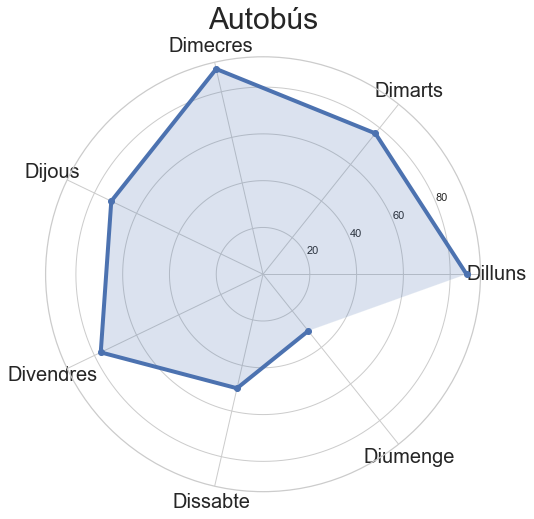

In [314]:

fig=plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, polar=True)   # Set polar axis
ax.plot(angles, day_val, 'o-', linewidth=4)  # Draw the plot (or the frame on the radar chart)
ax.fill(angles, day_val, alpha=0.2)  #Fulfill the area
ax.set_thetagrids(angles * 180/np.pi, labels, fontsize=20)  # Set the label for each axis
ax.set_title(title[0], fontsize=30)  
ax.grid(True)

In [315]:
def make_spider(angle, val, label, tit):
    fig=plt.figure(figsize=(15,8))
    ax = fig.add_subplot(111, polar=True)   # Set polar axis
    ax.plot(angle,  val, 'o-', linewidth=4)  # Draw the plot (or the frame on the radar chart) agregar color
    ax.fill(angle, val, alpha=0.2)  #Fulfill the area
    ax.set_thetagrids(angles* 180/np.pi, labels, fontsize=20)  # Set the label for each axis
    ax.set_title(tit, fontsize=30)
    ax.grid(True)
    plt.savefig(f'radar{tit}.png')
    
    #sns.palplot(sns.color_palette("cubehelix", 8))

c:\program files\python38\lib\site-packages\matplotlib\projections\polar.py:55: RuntimeWarning: invalid value encountered in greater_equal
  r = np.where(r >= 0, r, np.nan)
c:\program files\python38\lib\site-packages\matplotlib\projections\polar.py:55: RuntimeWarning: invalid value encountered in greater_equal
  r = np.where(r >= 0, r, np.nan)


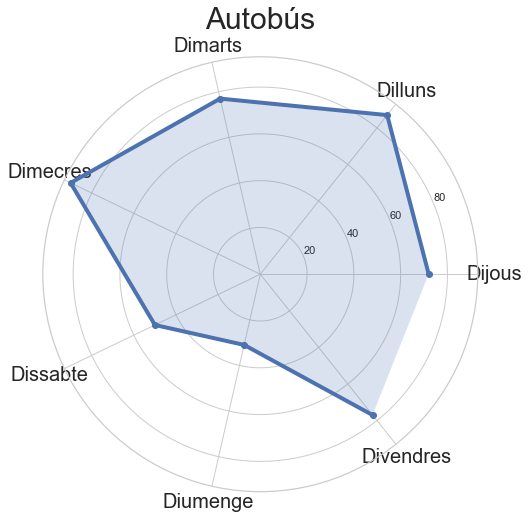

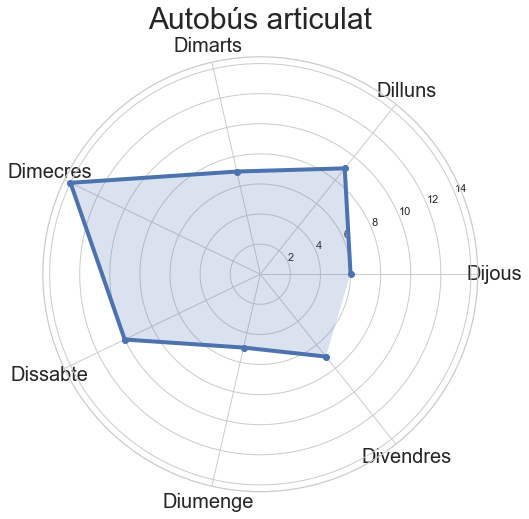

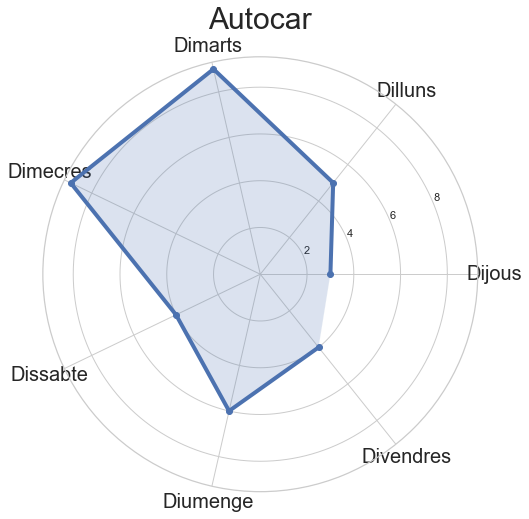

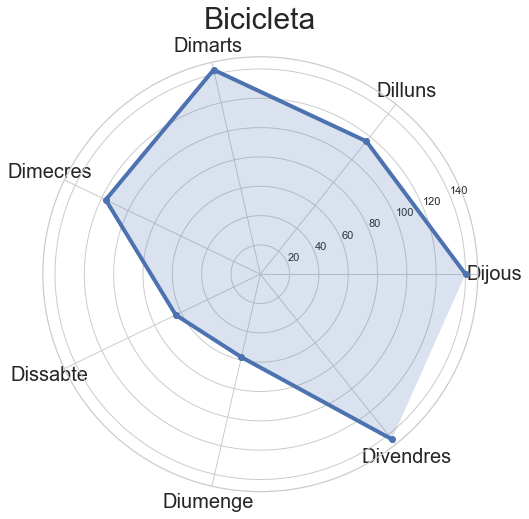

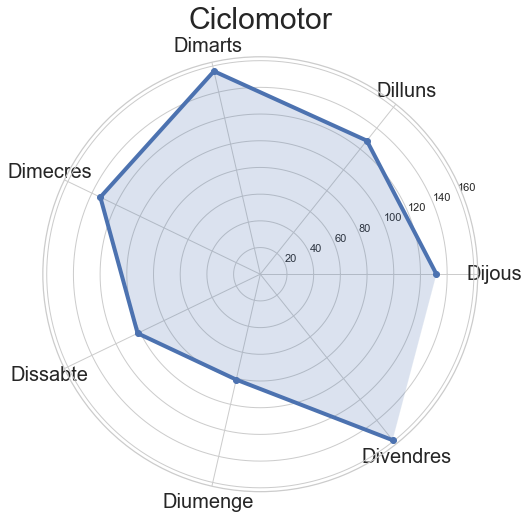

...

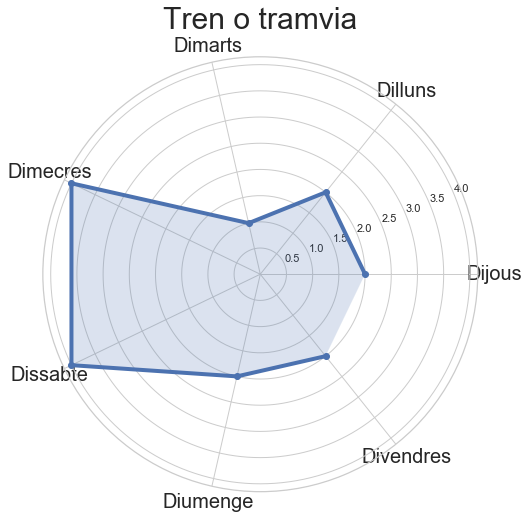

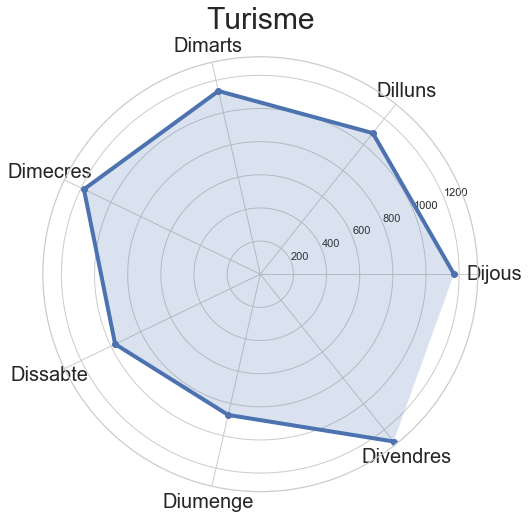

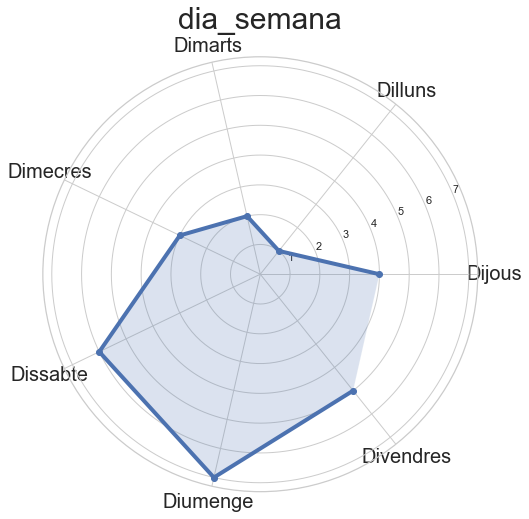

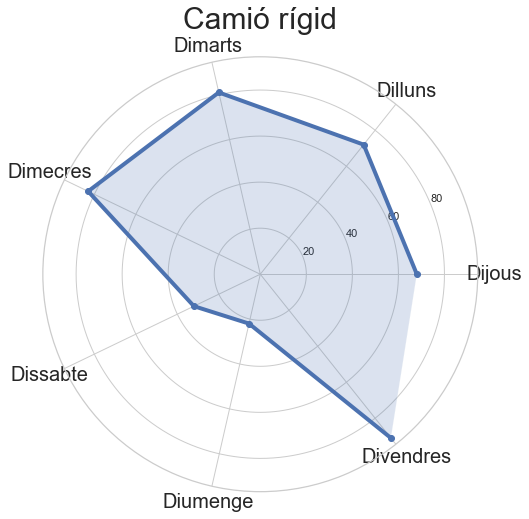

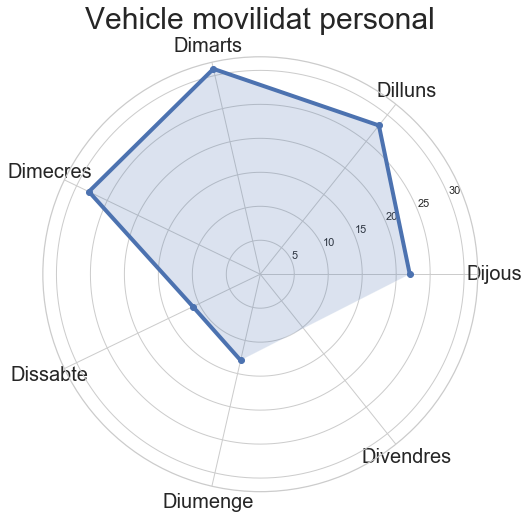

In [316]:
"""for row in range(0, len(acc_veh_day.index)):
make_spider( row=row, title=acc_veh_day[row], color=my_palette(row))
import random
color  = ['b','g','r','c','m','y','k']"""   
title   = acc_veh_day.columns

for row in range(2, len(title)):
    labels  = np.array(acc_veh_day.iloc[:,0])
    angles  = np.linspace(0, 2*np.pi, len(acc_veh_day.iloc[:,row]), endpoint=False)
    day_val = acc_veh_day.iloc[:,row].values
    title1   = acc_veh_day.columns[row]
    #colorea   = random.choice(color)
    
    make_spider(angles, day_val, labels, title1)
    
    
    

## ACCIDENTS BY VEHICULE

In [160]:
acc_by_veh_type = acc_veh_clean.groupby('Descripcio_tipus_vehicle', as_index=False)[['Codi_expedient']].count().sort_values(by='Codi_expedient',ascending=False)
acc_by_veh_type_top=acc_by_veh_type.head(7)

In [161]:
acc_by_veh_type.columns

Index(['Descripcio_tipus_vehicle', 'Codi_expedient'], dtype='object')

In [162]:
import seaborn as sns
sns.set(style="whitegrid") 

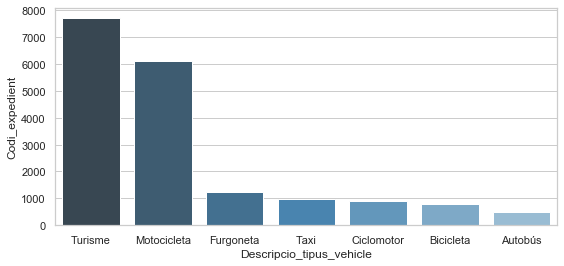

In [271]:
ax = plt.figure(figsize=(9,4))
sns.barplot(x="Descripcio_tipus_vehicle", y="Codi_expedient", data=acc_by_veh_type_top, palette="Blues_d")
plt.savefig('Acc_by_vehicule2.png', dpi=400)

In [211]:
acc_veh_gb = acc_veh_18[['Codi_expedient','Descripcio_tipus_vehicle',
       'Descripcio_model', 'Descripcio_marca','Descripcio_carnet', 'Antiguitat_carnet']]

In [214]:
acc_2018.columns

Index(['Numero_expedient', 'Codi_districte', 'Nom_districte', 'Codi_barri',
       'Nom_barri', 'Codi_carrer', 'Nom_carrer', 'Num_postal ',
       'Descripcio_dia_setmana', 'Dia_setmana', 'Descripcio_tipus_dia', 'Any',
       'Mes_any', 'Nom_mes', 'Dia_mes', 'Hora_dia', 'Descripcio_torn',
       'Descripcio_causa_vianant', 'Numero_morts', 'Numero_lesionats_lleus',
       'Numero_lesionats_greus', 'Numero_victimes',
       'Numero_vehicles_implicats', 'Coordenada_UTM_X', 'Coordenada_UTM_Y',
       'Longitud', 'Latitud'],
      dtype='object')

In [213]:
acc_veh_gb.head()

,Codi_expedient,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca,Descripcio_carnet,Antiguitat_carnet
0,2018S007344,Turisme,CORDOBA,SEAT,B,5
1,2018S009617,Turisme,206,PEUGEOT,B,1
2,2018S008382,"Camió rígid > 3,5 tones",Desconegut,DAF-HERMANNS,C,25
3,2018S002684,"Camió rígid > 3,5 tones",ML140E24 E,IVECO FIAT,C,11
4,2018S004886,Taxi,TOLEDO,SEAT,B,5


In [227]:
acc_by_veh=pd.merge(acc_veh_gb, acc_2018, how='outer', left_on='Codi_expedient', right_on='Numero_expedient')

In [228]:
acc_by_veh

,Codi_expedient,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca,Descripcio_carnet,Antiguitat_carnet,Numero_expedient,Codi_districte,Nom_districte,Codi_barri,...,Descripcio_causa_vianant,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
0,2018S007344,Turisme,CORDOBA,SEAT,B,5,2018S007344,1,Ciutat Vella,1,...,No és causa del vianant,0,1,0,1,1,431228.30,4581110.84,2.176455,41.376735
1,2018S009617,Turisme,206,PEUGEOT,B,1,2018S009617,1,Ciutat Vella,1,...,No és causa del vianant,0,3,0,3,1,431320.52,4580791.56,2.177594,41.373868
2,2018S008382,"Camió rígid > 3,5 tones",Desconegut,DAF-HERMANNS,C,25,2018S008382,1,Ciutat Vella,2,...,No és causa del vianant,0,0,0,0,1,431052.34,4581514.69,2.174305,41.380358
3,2018S002684,"Camió rígid > 3,5 tones",ML140E24 E,IVECO FIAT,C,11,2018S002684,1,Ciutat Vella,2,...,No és causa del vianant,0,0,0,0,1,431241.33,4581757.56,2.176538,41.382561
4,2018S004886,Taxi,TOLEDO,SEAT,B,5,2018S004886,1,Ciutat Vella,2,...,No és causa del vianant,0,2,0,2,3,431390.44,4581135.49,2.178391,41.376971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19100,NaN,NaN,NaN,NaN,NaN,NaN,2018S008765,10,Sant Martí,66,...,No és causa del vianant,0,0,0,0,0,432118.05,4583103.43,2.186871,41.394758
19101,NaN,NaN,NaN,NaN,NaN,NaN,2018S009449,2,Eixample,5,...,No és causa del vianant,0,0,0,0,0,431464.86,4583206.91,2.179047,41.395634
19102,NaN,NaN,NaN,NaN,NaN,NaN,2018S009415,5,Sarrià-Sant Gervasi,26,...,No és causa del vianant,0,0,0,0,0,428230.83,4583476.99,2.140333,41.397784
19103,NaN,NaN,NaN,NaN,NaN,NaN,2018S008677,5,Sarrià-Sant Gervasi,22,...,No és causa del vianant,0,0,0,0,0,425082.72,4585165.96,2.102469,41.412709


In [258]:
acc_graves_2018 = acc_by_veh.loc[(acc_by_veh['Numero_morts'] != 0) | (acc_by_veh['Numero_lesionats_greus'] != 0)]
acc_graves_2018

,Codi_expedient,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca,Descripcio_carnet,Antiguitat_carnet,Numero_expedient,Codi_districte,Nom_districte,Codi_barri,...,Descripcio_causa_vianant,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
13,2018S006309,Bicicleta,Desconegut,Desconegut,Desconegut,Desconegut,2018S006309,1,Ciutat Vella,4,...,No és causa del vianant,0,1,1,2,1,431651.13,4582718.81,2.181330,41.391254
71,2018S004603,Bicicleta,Desconegut,Desconegut,Desconegut,Desconegut,2018S004603,2,Eixample,8,...,No és causa del vianant,1,3,1,5,8,429640.11,4582207.73,2.157337,41.386477
72,2018S004603,Motocicleta,HW125 XENT,YAMAHA,Desconegut,Desconegut,2018S004603,2,Eixample,8,...,No és causa del vianant,1,3,1,5,8,429640.11,4582207.73,2.157337,41.386477
73,2018S004603,Motocicleta,PES,HONDA,Desconegut,Desconegut,2018S004603,2,Eixample,8,...,No és causa del vianant,1,3,1,5,8,429640.11,4582207.73,2.157337,41.386477
74,2018S004603,Motocicleta,PES125,HONDA,Desconegut,Desconegut,2018S004603,2,Eixample,8,...,No és causa del vianant,1,3,1,5,8,429640.11,4582207.73,2.157337,41.386477
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19071,2018S005965,Turisme,GOLF,VOLKSWAGEN,B,21,2018S005965,10,Sant Martí,71,...,No és causa del vianant,0,1,1,2,2,433427.03,4584453.69,2.202379,41.407029
19074,2018S000065,Bicicleta,Desconegut,BTWIN,Desconegut,Desconegut,2018S000065,10,Sant Martí,71,...,No és causa del vianant,0,0,1,1,2,433081.87,4584996.69,2.198190,41.411891
19075,2018S000065,Turisme,FOCUS,FORD,B,3,2018S000065,10,Sant Martí,71,...,No és causa del vianant,0,0,1,1,2,433081.87,4584996.69,2.198190,41.411891
19076,2018S009004,Ciclomotor,TWEET,PEUGEOT,AM,12,2018S009004,10,Sant Martí,71,...,No és causa del vianant,0,0,1,1,2,432986.83,4584903.52,2.197063,41.411044


In [259]:
acc_graves_2018.loc[acc_graves_2018['Descripcio_tipus_vehicle'] == 'Autobús articulat', 'Descripcio_tipus_vehicle']='Autobús'
acc_graves_2018.loc[acc_graves_2018['Descripcio_tipus_vehicle'] == 'Autocar', 'Descripcio_tipus_vehicle']='Autobús'
acc_graves_2018.loc[acc_graves_2018['Descripcio_tipus_vehicle'] == 'Camió rígid <= 3,5 tones', 'Descripcio_tipus_vehicle']='Camio'
acc_graves_2018.loc[acc_graves_2018['Descripcio_tipus_vehicle'] == 'Camió rígid > 3,5 tones', 'Descripcio_tipus_vehicle']='Camio'
acc_graves_2018.loc[acc_graves_2018['Descripcio_tipus_vehicle'] == 'Ciclomotor', 'Descripcio_tipus_vehicle']='Motocicleta'

c:\program files\python38\lib\site-packages\pandas\core\indexing.py:964: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [266]:
acc_graves_type_veh = acc_graves_2018.groupby('Descripcio_tipus_vehicle', as_index=False).sum()

In [267]:
acc_graves_type_veh

,Descripcio_tipus_vehicle,Codi_districte,Codi_barri,Codi_carrer,Any,Mes_any,Dia_mes,Hora_dia,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
0,Altres vehicles amb motor,1.000000,3.000000,701266.000000,2018.0,11.000000,16.000000,8.000000,0.000000,1.000000,1.000000,2.000000,3.000000,432683.810000,4.582138e+06,2.193746,41.386113
1,Autobús,3.666667,18.333333,266062.388889,2018.0,5.944444,16.555556,14.222222,0.055556,0.277778,0.944444,1.277778,1.222222,429560.174444,4.582848e+06,2.156310,41.392231
2,Bicicleta,6.105263,38.000000,166509.105263,2018.0,7.052632,15.052632,14.210526,0.052632,0.263158,1.000000,1.315789,2.210526,431022.748421,4.583399e+06,2.173739,41.397326
3,Camio,4.909091,27.272727,213517.545455,2018.0,6.818182,18.545455,14.090909,0.363636,1.272727,0.636364,2.272727,3.727273,429409.922727,4.582726e+06,2.154530,41.391123
4,Furgoneta,4.633333,26.800000,229909.266667,2018.0,5.166667,14.866667,14.033333,0.033333,0.133333,1.000000,1.166667,1.900000,430112.565333,4.583474e+06,2.162845,41.397917
5,Maquinària d'obres i serveis,3.000000,12.000000,701481.000000,2018.0,7.000000,3.000000,15.000000,0.000000,0.000000,1.000000,1.000000,1.000000,426521.080000,4.575874e+06,2.120804,41.329149
6,Motocicleta,4.840796,27.532338,211324.248756,2018.0,6.611940,15.527363,14.751244,0.099502,0.741294,1.000000,1.840796,2.741294,430277.467015,4.583736e+06,2.164787,41.400291
7,Taxi,4.714286,27.500000,163936.285714,2018.0,6.285714,16.142857,15.285714,0.285714,1.357143,0.785714,2.428571,3.357143,430254.591429,4.583148e+06,2.164583,41.395001
8,Tot terreny,3.000000,15.000000,169409.000000,2018.0,8.000000,17.000000,2.000000,0.000000,0.000000,1.000000,1.000000,2.000000,428691.280000,4.580705e+06,2.146167,41.372857
9,Tren o tramvia,10.000000,68.000000,93453.500000,2018.0,8.000000,21.000000,20.000000,0.000000,0.000000,1.000000,1.000000,2.000000,433311.520000,4.584448e+06,2.200998,41.406969


In [268]:
acc_graves_top=acc_graves_type_veh[['Descripcio_tipus_vehicle','Numero_victimes']].sort_values(by='Numero_victimes',ascending=False).head(8)

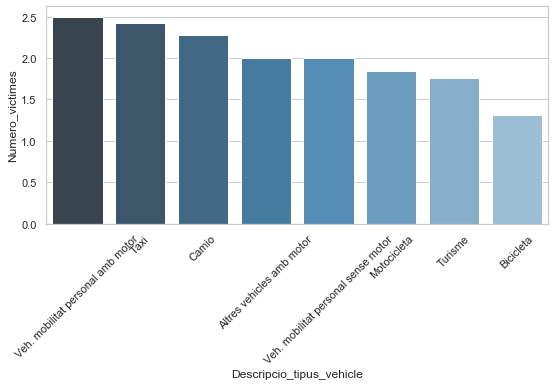

In [269]:
ax = plt.figure(figsize=(9,4))
g = sns.barplot(x="Descripcio_tipus_vehicle", y="Numero_victimes", data=acc_graves_top, palette="Blues_d")
plt.xticks(rotation=45)
plt.savefig('Acc_graves_by_vehicule_mean.png', dpi=400)

## Round Lat & Lon

In [208]:
#df.round({"A":1, "B":2, "C":3, "D":4}) 
acc_18 = acc_2018.round({'Latitud':4,'Longitud':4})
acc_18.head(1)

,Numero_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Codi_carrer,Nom_carrer,Num_postal,Descripcio_dia_setmana,Dia_setmana,...,Descripcio_causa_vianant,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
0,2018S000150,3,Sants-Montjuïc,12,la Marina del Prat Vermell,701819,Número 3 Zona Franca / E Zona Franca ...,69-75,Dilluns,Dl,...,No és causa del vianant,0,1,0,1,2,427265.97,4576644.81,2.1296,41.3362


# MAPA BASE

In [34]:
a = folium.Map(location=[41.3902, 2.1540], 
               zoom_start=12,
               tiles='CartoDB dark_matter')

marker = folium.CircleMarker(location=[41.3902, 2.1540]).add_to(a)

In [35]:
a.save('map.html')

In [36]:

b = folium.Map(location=[41.3902, 2.1540], 
               zoom_start=12,
               tiles='cartodbpositron')#'Stamen Terrain'

for index, row in acc_2018.sample(1500).iterrows():
    radi = (row['Numero_morts']*4 + row['Numero_victimes']/2)
    #popup_text = "{}<br> total death: {}<br> total injured: {}"
    #popup_text = popup_text.format(row["Numero_morts"], row["Numero_victimes"], acc_18)
    if row['Numero_morts'] > 0:
        color="#E37222"
    else:
        color="#0A8A9F"
    folium.CircleMarker(location=[row['Latitud'],row['Longitud']],
                         radius=radi,
                         color=color,
                         #popup = popup_text,
                         fill=True).add_to(b)
        
        
    """folium.CircleMarker(location=(row, acc_gu_18.Latitud],
                                 [row, acc_gu_18.Longitud]),
                                 
                                 
                                 
                                 popup_text = "{}<br> total departures: {}<br> total arrivals: {}<br> net departures: {}"
        popup_text = popup_text.format(row["Start Station Name"],
                          row["Arrival Count"],
                          row["Departure Count"],
                          net_departures)"""
    
    

In [37]:
b

## Fatal Accidents

In [200]:
acc_graves_2018 = acc_2018.loc[(acc_2018['Numero_morts'] != 0) | (acc_2018['Numero_lesionats_greus'] != 0)]
acc_graves_2018.columns

Index(['Numero_expedient', 'Codi_districte', 'Nom_districte', 'Codi_barri',
       'Nom_barri', 'Codi_carrer', 'Nom_carrer', 'Num_postal ',
       'Descripcio_dia_setmana', 'Dia_setmana', 'Descripcio_tipus_dia', 'Any',
       'Mes_any', 'Nom_mes', 'Dia_mes', 'Hora_dia', 'Descripcio_torn',
       'Descripcio_causa_vianant', 'Numero_morts', 'Numero_lesionats_lleus',
       'Numero_lesionats_greus', 'Numero_victimes',
       'Numero_vehicles_implicats', 'Coordenada_UTM_X', 'Coordenada_UTM_Y',
       'Longitud', 'Latitud'],
      dtype='object')

In [204]:
acc_graves_2018.iloc[1,0]

'2018S005123    '

In [203]:
acc_by_veh_type.iloc[1,1:]

Codi_expedient    6102
Name: 11, dtype: object

In [1]:
c = folium.Map(location=[41.3902, 2.1540], 
               zoom_start=13,
               tiles='cartodbpositron')

for index, row in acc_graves_2018.iterrows():
    radi = (row['Numero_morts']*6 + row['Numero_victimes']*3)
    acc_gra =(row['Numero_morts'],row['Numero_victimes'])
    popup_text = "<br>adress: {}<br> total death: {}<br> total injured: {}"
    popup_text = popup_text.format(row["Nom_carrer"], row["Numero_morts"], row["Numero_victimes"], acc_gra)
    if row['Numero_morts'] > 0:
        color="#E37222"
    else:
        color="#0A8A9F"
    folium.CircleMarker(location=[row['Latitud'],row['Longitud']],
                         radius=radi,
                         color=color,
                         popup = popup_text,
                         fill=True).add_to(c)
    m.save('fatal_acc_2018.html')
        

NameError: name 'folium' is not defined

In [2]:
c

NameError: name 'c' is not defined

## Accidents by district

In [41]:
import os

In [42]:
bcn_neigh = geopandas.read_file("http://data.insideairbnb.com/spain/catalonia/barcelona/2019-11-09/visualisations/neighbourhoods.geojson")
bcn_neigh.neighbourhood_group.unique()

array(['Ciutat Vella', 'Eixample', 'Sants-Montjuïc', 'Sant Martí',
       'Les Corts', 'Horta-Guinardó', 'Sarrià-Sant Gervasi', 'Gràcia',
       'Nou Barris', 'Sant Andreu'], dtype=object)

In [43]:
bcn_districts = geopandas.read_file('bcn-geodata/districtes/shapefiles_barcelona_distrito.geojson')

In [44]:
#bcn_districts.rename(columns={'n_distri':'Nom_districte'}, inplace=True)

In [45]:
bcn_districts.columns

Index(['cartodb_id', 'c_distri', 'n_distri', 'homes', 'dones', 'area', 'perim',
       'coord_x', 'coord_y', 'web_1', 'web_2', 'web_3', 'geometry'],
      dtype='object')

In [46]:
distr_bcn = bcn_districts[['cartodb_id', 'c_distri', 'n_distri', 'area', 'perim','coord_x', 'coord_y', 'geometry']]

In [47]:
distr_bcn

,cartodb_id,c_distri,n_distri,area,perim,coord_x,coord_y,geometry
0,5,05,Sarrià -Sant Gervasi,2.009280e+07,37563.642237,425388.507986,4.585170e+06,"MULTIPOLYGON (((2.07212 41.41270, 2.07050 41.4..."
1,7,07,Horta-Guinardo,1.194708e+07,20413.187364,429117.618770,4.586950e+06,"MULTIPOLYGON (((2.17616 41.42544, 2.17654 41.4..."
2,1,01,Ciutat Vella,4.368465e+06,21035.207261,431616.773990,4.581564e+06,"MULTIPOLYGON (((2.18239 41.39143, 2.18346 41.3..."
3,2,02,Eixample,7.476392e+06,13902.573980,430243.353657,4.582773e+06,"MULTIPOLYGON (((2.18239 41.39143, 2.18134 41.3..."
4,3,03,Sants-Montjuic,2.294042e+07,47125.925905,428562.773279,4.578163e+06,"MULTIPOLYGON (((2.16785 41.37498, 2.16856 41.3..."
5,4,04,Les Corts,6.017532e+06,12481.472647,426369.646389,4.582295e+06,"MULTIPOLYGON (((2.10291 41.40109, 2.10295 41.4..."
6,6,06,Gracia,4.185517e+06,12280.060880,429253.013001,4.584840e+06,"MULTIPOLYGON (((2.16865 41.40696, 2.16979 41.4..."
7,8,08,Nou Barris,8.041439e+06,14698.411907,431185.040621,4.588829e+06,"MULTIPOLYGON (((2.18745 41.46213, 2.18744 41.4..."
8,9,09,Sant Andreu,6.565322e+06,15132.450209,432697.846739,4.587572e+06,"MULTIPOLYGON (((2.20719 41.42756, 2.20558 41.4..."
9,10,10,Sant Martí­,1.052376e+07,20736.527911,433330.835564,4.584520e+06,"MULTIPOLYGON (((2.20719 41.42756, 2.20715 41.4..."


In [48]:
distr_bcn.rename(columns={'c_distri':'Codi_districte'}, inplace=True)
distr_bcn

c:\program files\python38\lib\site-packages\pandas\core\frame.py:4122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


,cartodb_id,Codi_districte,n_distri,area,perim,coord_x,coord_y,geometry
0,5,05,Sarrià -Sant Gervasi,2.009280e+07,37563.642237,425388.507986,4.585170e+06,"MULTIPOLYGON (((2.07212 41.41270, 2.07050 41.4..."
1,7,07,Horta-Guinardo,1.194708e+07,20413.187364,429117.618770,4.586950e+06,"MULTIPOLYGON (((2.17616 41.42544, 2.17654 41.4..."
2,1,01,Ciutat Vella,4.368465e+06,21035.207261,431616.773990,4.581564e+06,"MULTIPOLYGON (((2.18239 41.39143, 2.18346 41.3..."
3,2,02,Eixample,7.476392e+06,13902.573980,430243.353657,4.582773e+06,"MULTIPOLYGON (((2.18239 41.39143, 2.18134 41.3..."
4,3,03,Sants-Montjuic,2.294042e+07,47125.925905,428562.773279,4.578163e+06,"MULTIPOLYGON (((2.16785 41.37498, 2.16856 41.3..."
5,4,04,Les Corts,6.017532e+06,12481.472647,426369.646389,4.582295e+06,"MULTIPOLYGON (((2.10291 41.40109, 2.10295 41.4..."
6,6,06,Gracia,4.185517e+06,12280.060880,429253.013001,4.584840e+06,"MULTIPOLYGON (((2.16865 41.40696, 2.16979 41.4..."
7,8,08,Nou Barris,8.041439e+06,14698.411907,431185.040621,4.588829e+06,"MULTIPOLYGON (((2.18745 41.46213, 2.18744 41.4..."
8,9,09,Sant Andreu,6.565322e+06,15132.450209,432697.846739,4.587572e+06,"MULTIPOLYGON (((2.20719 41.42756, 2.20558 41.4..."
9,10,10,Sant Martí­,1.052376e+07,20736.527911,433330.835564,4.584520e+06,"MULTIPOLYGON (((2.20719 41.42756, 2.20715 41.4..."


In [49]:
acc_dist= acc_2018.groupby(['Codi_districte','Nom_districte'],as_index=False).sum()


In [50]:
acc_dist = acc_dist[['Codi_districte','Nom_districte','Numero_morts', 'Numero_lesionats_lleus',
                     'Numero_lesionats_greus', 'Numero_victimes','Numero_vehicles_implicats']]
acc_dist['codi_barri']=range(1,11)
acc_dist['codi_barri']=acc_dist.codi_barri.astype('str')



In [51]:
acc_dist['codi_barri']=acc_dist['codi_barri'].apply(lambda x: x.zfill(2))

In [52]:
import geojson

In [53]:
with open('bcn-geodata\districtes\districtes.geojson') as f:
    geojs = geojson.load(f)

In [54]:
import folium

In [402]:
m = folium.Map(location=[41.3902, 2.1540], 
               zoom_start=12,
               tiles='Stamen Terrain')
               
m.choropleth(
    geo_data=geojs,
    name='choropleth',
    data=acc_dist,
    columns=['codi_barri','Numero_victimes'],
    key_on="properties.DISTRICTE",
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='accidents by District'
)
folium.LayerControl().add_to(m)
               
m.save('acc_by_districte.html')

In [403]:
m

## Accidents by neighbourhood

In [57]:
with open('bcn-geodata/barris/barris.geojson') as f:
    geojs2 = geojson.load(f)

In [58]:
acc_barri= acc_2018.groupby(['Codi_barri','Nom_barri'],as_index=False).sum()

In [59]:
acc_barri[['Codi_barri','Nom_barri','Numero_morts', 'Numero_lesionats_lleus',
                     'Numero_lesionats_greus', 'Numero_victimes','Numero_vehicles_implicats']]

,Codi_barri,Nom_barri,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats
0,1,el Raval,0,141,2,143,226
1,2,el Barri Gòtic,1,171,3,175,278
2,3,la Barceloneta,0,158,5,163,237
3,4,"Sant Pere, Santa Caterina i la Ribera",0,134,7,141,225
4,5,el Fort Pienc,0,335,5,340,539
...,...,...,...,...,...,...,...
68,69,Diagonal Mar i el Front Marítim del Poblenou,0,160,1,161,266
69,70,el Besòs i el Maresme,0,66,0,66,116
70,71,Provençals del Poblenou,1,212,16,229,345
71,72,Sant Martí de Provençals,0,79,1,80,136


In [60]:
acc_barri['codi_barri']=range(1,74)
acc_barri['codi_barri']=acc_barri.codi_barri.astype('str')

In [61]:
acc_barri['codi_barri']=acc_barri['codi_barri'].apply(lambda x: x.zfill(2))

In [62]:
acc_barri.head()

,Codi_barri,Nom_barri,Codi_districte,Codi_carrer,Any,Mes_any,Dia_mes,Hora_dia,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud,codi_barri
0,1,el Raval,140,39881331,282520,919,2085,1883,0,141,2,143,226,6.030416e+07,6.413802e+08,303.890241,5792.959346,01
1,2,el Barri Gòtic,164,49146821,330952,1085,2612,2133,1,171,3,175,278,7.073833e+07,7.513884e+08,357.130851,6786.562828,02
2,3,la Barceloneta,126,57716068,254268,822,2126,1733,0,158,5,163,237,5.448230e+07,5.773061e+08,275.987952,129246.100671,03
3,4,"Sant Pere, Santa Caterina i la Ribera",132,27137425,266376,827,2097,1791,0,134,7,141,225,5.697594e+07,6.048274e+08,287.921792,5462.821674,04
4,5,el Fort Pienc,560,48127575,565040,1876,4398,3860,0,335,5,340,539,1.208416e+08,1.283381e+09,610.499469,11591.532885,05


In [400]:
m = folium.Map(location=[41.3902, 2.1540], 
               zoom_start=12,
               tiles='Stamen Terrain')


m.choropleth(
    geo_data=geojs2,
    name='choropleth',
    data=acc_barri,
    columns=['codi_barri','Numero_victimes'],
    key_on="properties.BARRI",
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    
    legend_name='accidents by neigbourhood'
)
folium.LayerControl().add_to(m)
               
m.save('acc_by_neighbourhood.html')

In [401]:
m